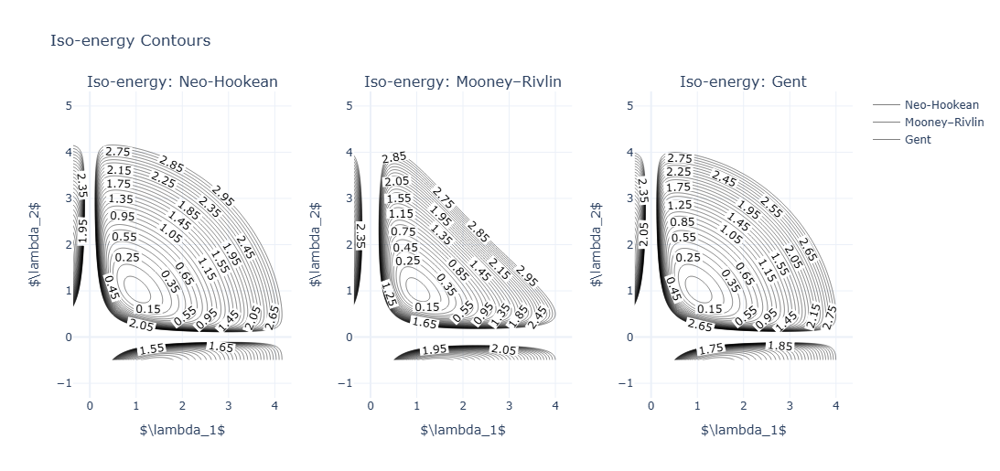

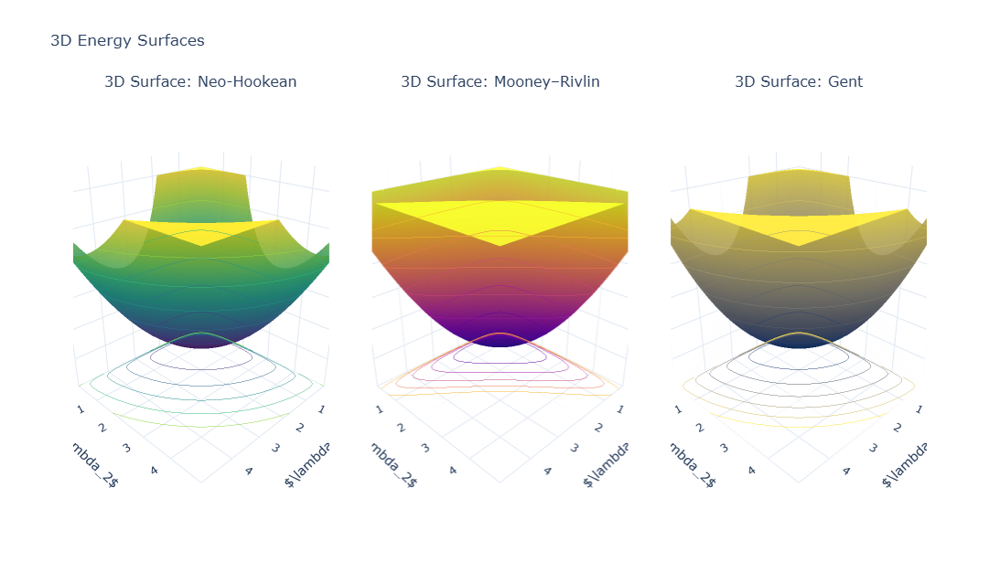

In [1]:
import numpy as np
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# --- Parameters ---
c10N, c01N = 0.2, 0.05
muN = 0.4
Jm = 80.0

levels = [0.05, 0.10, 0.20, 0.30, 0.50, 1.0, 1.5, 2.0, 3.0]
zmax = max(levels) * 2.0

# --- 2D grid ---
lam_vec = np.linspace(-0.5, 5.0, 600)
Lam1, Lam2 = np.meshgrid(lam_vec, lam_vec)
Lam3 = 1.0 / (Lam1 * Lam2)

I1 = Lam1**2 + Lam2**2 + Lam3**2
I2 = Lam1**2 * Lam2**2 + Lam2**2 * Lam3**2 + Lam3**2 * Lam1**2

W_NH = muN / 2 * (I1 - 3)
W_MR = c10N * (I1 - 3) + c01N * (I2 - 3)

with np.errstate(invalid='ignore', divide='ignore'):
    arg = 1 - (I1 - 3) / Jm
    W_Gent = np.where(arg > 0, -muN * Jm / 2 * np.log(arg), np.nan)

# --- 3D grid ---
lv3 = np.linspace(0.1, 5.0, 250)
L1, L2 = np.meshgrid(lv3, lv3)
L3 = 1.0 / (L1 * L2)
# --- Parameters ---

c10N, c01N = 0.2, 0.05
muN = 0.4
Jm = 80.0

levels = [0.05, 0.10, 0.20, 0.30, 0.50, 1.0, 1.5, 2.0, 3.0]
zmax = max(levels) * 2.0

# --- 2D grid ---
lam_vec = np.linspace(-0.5, 5.0, 600)
Lam1, Lam2 = np.meshgrid(lam_vec, lam_vec)
Lam3 = 1.0 / (Lam1 * Lam2)
I1 = Lam1**2 + Lam2**2 + Lam3**2
I2 = Lam1**2*Lam2**2 + Lam2**2*Lam3**2 + Lam3**2*Lam1**2

W_NH  = muN/2 * (I1 - 3)
W_MR  = c10N*(I1 - 3) + c01N*(I2 - 3)
with np.errstate(invalid='ignore', divide='ignore'):
    W_Gent = np.where((arg := 1-(I1-3)/Jm) > 0, -muN*Jm/2*np.log(arg), np.nan)

# --- 3D grid ---
lv3 = np.linspace(0.1, 5.0, 250)
L1, L2 = np.meshgrid(lv3, lv3)
L3 = 1.0 / (L1 * L2)
i1 = L1**2 + L2**2 + L3**2
i2 = L1**2*L2**2 + L2**2*L3**2 + L3**2*L1**2

W_NH_3d = muN/2 * (i1 - 3)
W_MR_3d = c10N*(i1 - 3) + c01N*(i2 - 3)
with np.errstate(invalid='ignore', divide='ignore'):
    W_Gent_3d = np.where((arg3 := 1-(i1-3)/Jm) > 0, -muN*Jm/2*np.log(arg3), np.nan)

models = [
    ('Neo-Hookean',   W_NH,   W_NH_3d,   'viridis'),
    ('Mooney–Rivlin', W_MR,   W_MR_3d,   'plasma'),
    ('Gent',          W_Gent, W_Gent_3d, 'cividis'),
]

fig = plt.figure(figsize=(18, 10))

for col, (title, W2d, W3d, cmap) in enumerate(models):
    # --- 2D contour (top row) ---
    ax2 = fig.add_subplot(1, 3, col + 1)
    ax2.contour(Lam1, Lam2, W2d, levels=levels, colors='k')
    ax2.set_xlim(0, 4); ax2.set_ylim(0, 4)
    ax2.set_xlabel(r'$\lambda_1$'); ax2.set_ylabel(r'$\lambda_2$')
    ax2.set_title(f'Iso-energy: {title}')
    ax2.set_aspect('equal')
    ax2.grid(False)

plt.tight_layout()
plt.show()
fig2 = plt.figure(figsize=(18, 6))   # new figure for 3D surfaces

for col, (title, W2d, W3d, cmap) in enumerate(models):
    # --- 3D surface (bottom row) ---
    ax3 = fig2.add_subplot(1, 3, col + 1, projection='3d')
    Z = np.clip(W3d, 0, zmax)
    ax3.plot_surface(L1, L2, Z, cmap=cmap, alpha=0.8,
                     linewidth=0, antialiased=True)
    ax3.contour(L1, L2, Z, levels=levels, colors='k', linewidths=1.0)
    ax3.contour(L1, L2, Z, levels=levels, zdir='z',
                offset=0, cmap=cmap)
    ax3.set_xlim(0.1, 5); ax3.set_ylim(0.1, 5); ax3.set_zlim(0, 1.1*zmax)
    ax3.set_xlabel(r'$\lambda_1$', fontsize=12); ax3.set_ylabel(r'$\lambda_2$', fontsize=12)
    ax3.set_zlabel('W (MPa)',fontsize=12)
    ax3.set_title(f'3D Surface: {title}', fontsize=18, fontweight='bold')

    ax3.grid(False)
    ax3.view# --- Parameters ---

c10N, c01N = 0.2, 0.05
muN = 0.4
Jm = 80.0

levels = [0.05, 0.10, 0.20, 0.30, 0.50, 1.0, 1.5, 2.0, 3.0]
zmax = max(levels) * 2.0

# --- 2D grid ---
lam_vec = np.linspace(-0.5, 5.0, 600)
Lam1, Lam2 = np.meshgrid(lam_vec, lam_vec)
Lam3 = 1.0 / (Lam1 * Lam2)
I1 = Lam1**2 + Lam2**2 + Lam3**2
I2 = Lam1**2*Lam2**2 + Lam2**2*Lam3**2 + Lam3**2*Lam1**2

W_NH  = muN/2 * (I1 - 3)
W_MR  = c10N*(I1 - 3) + c01N*(I2 - 3)
with np.errstate(invalid='ignore', divide='ignore'):
    W_Gent = np.where((arg := 1-(I1-3)/Jm) > 0, -muN*Jm/2*np.log(arg), np.nan)

# --- 3D grid ---
lv3 = np.linspace(0.1, 5.0, 250)
L1, L2 = np.meshgrid(lv3, lv3)
L3 = 1.0 / (L1 * L2)
i1 = L1**2 + L2**2 + L3**2
i2 = L1**2*L2**2 + L2**2*L3**2 + L3**2*L1**2

W_NH_3d = muN/2 * (i1 - 3)
W_MR_3d = c10N*(i1 - 3) + c01N*(i2 - 3)
with np.errstate(invalid='ignore', divide='ignore'):
    W_Gent_3d = np.where((arg3 := 1-(i1-3)/Jm) > 0, -muN*Jm/2*np.log(arg3), np.nan)

models = [
    ('Neo-Hookean',   W_NH,   W_NH_3d,   'viridis'),
    ('Mooney–Rivlin', W_MR,   W_MR_3d,   'plasma'),
    ('Gent',          W_Gent, W_Gent_3d, 'cividis'),
]

fig = plt.figure(figsize=(18, 10))

for col, (title, W2d, W3d, cmap) in enumerate(models):
    # --- 2D contour (top row) ---
    ax2 = fig.add_subplot(1, 3, col + 1)
    ax2.contour(Lam1, Lam2, W2d, levels=levels, colors='k')
    ax2.set_xlim(0, 4); ax2.set_ylim(0, 4)
    ax2.set_xlabel(r'$\lambda_1$'); ax2.set_ylabel(r'$\lambda_2$')
    ax2.set_title(f'Iso-energy: {title}')
    ax2.set_aspect('equal')
    ax2.grid(False)

plt.tight_layout()
plt.show()
fig2 = plt.figure(figsize=(18, 6))   # new figure for 3D surfaces

for col, (title, W2d, W3d, cmap) in enumerate(models):
    # --- 3D surface (bottom row) ---
    ax3 = fig2.add_subplot(1, 3, col + 1, projection='3d')
    Z = np.clip(W3d, 0, zmax)
    ax3.plot_surface(L1, L2, Z, cmap=cmap, alpha=0.8,
                     linewidth=0, antialiased=True)
    ax3.contour(L1, L2, Z, levels=levels, colors='k', linewidths=1.0)
    ax3.contour(L1, L2, Z, levels=levels, zdir='z',
                offset=0, cmap=cmap)
    ax3.set_xlim(0.1, 5); ax3.set_ylim(0.1, 5); ax3.set_zlim(0, 1.1*zmax)
    ax3.set_xlabel(r'$\lambda_1$', fontsize=12); ax3.set_ylabel(r'$\lambda_2$', fontsize=12)
    ax3.set_zlabel('W (MPa)',fontsize=12)
    ax3.set_title(f'3D Surface: {title}', fontsize=18, fontweight='bold')

    ax3.grid(False)
    ax3.view_init(elev=30, azim=-60)

    ax3.xaxis.set_major_locator(MaxNLocator(3))
    ax3.yaxis.set_major_locator(MaxNLocator(3))
    ax3.zaxis.set_major_locator(MaxNLocator(3))
    ax3.tick_params(axis='x', pad=0)
    ax3.tick_params(axis='y', pad=0)
    ax3.tick_params(axis='z', pad=0)

plt.tight_layout()
plt.show()
_init(elev=30, azim=-60)

    ax3.xaxis.set_major_locator(MaxNLocator(3))
    ax3.yaxis.set_major_locator(MaxNLocator(3))
    ax3.zaxis.set_major_locator(MaxNLocator(3))
    ax3.tick_params(axis='x', pad=0)
    ax3.tick_params(axis='y', pad=0)
    ax3.tick_params(axis='z', pad=0)

plt.tight_layout()
plt.show()

i1 = L1**2 + L2**2 + L3**2
i2 = L1**2 * L2**2 + L2**2 * L3**2 + L3**2 * L1**2

W_NH_3d = muN / 2 * (i1 - 3)
W_MR_3d = c10N * (i1 - 3) + c01N * (i2 - 3)

with np.errstate(invalid='ignore', divide='ignore'):
    arg3 = 1 - (i1 - 3) / Jm
    W_Gent_3d = np.where(arg3 > 0, -muN * Jm / 2 * np.log(arg3), np.nan)

models = [
    ("Neo-Hookean", W_NH, W_NH_3d, "Viridis"),
    ("Mooney–Rivlin", W_MR, W_MR_3d, "Plasma"),
    ("Gent", W_Gent, W_Gent_3d, "Cividis"),
]

# =========================
# 1) 2D contour subplots
# =========================
fig2d = make_subplots(
    rows=1, cols=3,
    subplot_titles=[f"Iso-energy: {m[0]}" for m in models],
    horizontal_spacing=0.08
)

for col, (title, W2d, W3d, cmap) in enumerate(models, start=1):
    fig2d.add_trace(
        go.Contour(
            x=lam_vec,
            y=lam_vec,
            z=W2d,
            contours=dict(
                start=min(levels),
                end=max(levels),
                size=0.1,
                coloring='none',
                showlabels=True
            ),
            line=dict(color='black'),
            showscale=False,
            name=title
        ),
        row=1, col=col
    )

    fig2d.update_xaxes(title_text=r'$\lambda_1$', range=[0, 4], row=1, col=col)
    fig2d.update_yaxes(title_text=r'$\lambda_2$', range=[0, 4], scaleanchor=f"x{col}", scaleratio=1, row=1, col=col)

fig2d.update_layout(
    width=1600,
    height=500,
    title_text="Iso-energy Contours",
    template="plotly_white"
)

fig2d.show()

# =========================
# 2) 3D surface subplots
# =========================
fig3d = make_subplots(
    rows=1, cols=3,
    specs=[[{'type': 'surface'}, {'type': 'surface'}, {'type': 'surface'}]],
    subplot_titles=[f"3D Surface: {m[0]}" for m in models],
    horizontal_spacing=0.05
)

for col, (title, W2d, W3d, cmap) in enumerate(models, start=1):
    Z = np.clip(W3d, 0, zmax)

    fig3d.add_trace(
        go.Surface(
            x=L1,
            y=L2,
            z=Z,
            colorscale=cmap,
            showscale=False,
            opacity=0.85,
            contours=dict(
                z=dict(
                    show=True,
                    usecolormap=True,
                    highlightcolor="black",
                    project_z=True
                )
            )
        ),
        row=1, col=col
    )

# Set axis titles and ranges for each subplot
for col in range(1, 4):
    scene_name = f"scene{col}" if col > 1 else "scene"
    fig3d.update_layout(**{
        scene_name: dict(
            xaxis=dict(title=r'$\lambda_1$', range=[0.1, 5]),
            yaxis=dict(title=r'$\lambda_2$', range=[0.1, 5]),
            zaxis=dict(title='W (MPa)', range=[0, 1.1 * zmax]),
            camera=dict(eye=dict(x=1.5, y=1.5, z=1.0))
        )
    })

fig3d.update_layout(
    width=1700,
    height=600,
    title_text="3D Energy Surfaces",
    template="plotly_white"
)

fig3d.show()


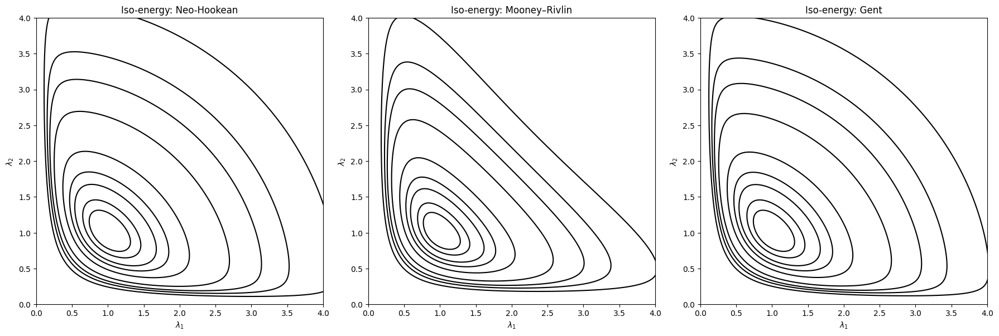

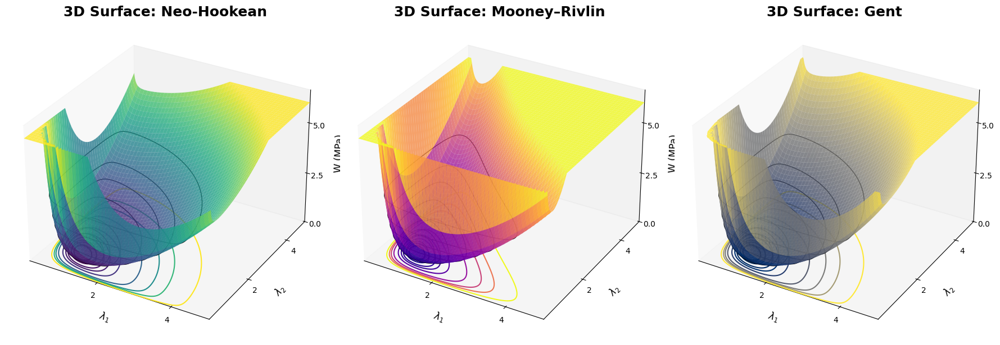

In [4]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.ticker import MaxNLocator
# --- Parameters ---
c10N, c01N = 0.2, 0.05
muN = 0.4
Jm = 80.0

levels = [0.05, 0.10, 0.20, 0.30, 0.50, 1.0, 1.5, 2.0, 3.0]
zmax = max(levels) * 2.0

# --- 2D grid ---
lam_vec = np.linspace(-0.5, 5.0, 600)
Lam1, Lam2 = np.meshgrid(lam_vec, lam_vec)
Lam3 = 1.0 / (Lam1 * Lam2)
I1 = Lam1**2 + Lam2**2 + Lam3**2
I2 = Lam1**2*Lam2**2 + Lam2**2*Lam3**2 + Lam3**2*Lam1**2

W_NH  = muN/2 * (I1 - 3)
W_MR  = c10N*(I1 - 3) + c01N*(I2 - 3)
with np.errstate(invalid='ignore', divide='ignore'):
    W_Gent = np.where((arg := 1-(I1-3)/Jm) > 0, -muN*Jm/2*np.log(arg), np.nan)

# --- 3D grid ---
lv3 = np.linspace(0.1, 5.0, 250)
L1, L2 = np.meshgrid(lv3, lv3)
L3 = 1.0 / (L1 * L2)
i1 = L1**2 + L2**2 + L3**2
i2 = L1**2*L2**2 + L2**2*L3**2 + L3**2*L1**2

W_NH_3d = muN/2 * (i1 - 3)
W_MR_3d = c10N*(i1 - 3) + c01N*(i2 - 3)
with np.errstate(invalid='ignore', divide='ignore'):
    W_Gent_3d = np.where((arg3 := 1-(i1-3)/Jm) > 0, -muN*Jm/2*np.log(arg3), np.nan)

models = [
    ('Neo-Hookean',   W_NH,   W_NH_3d,   'viridis'),
    ('Mooney–Rivlin', W_MR,   W_MR_3d,   'plasma'),
    ('Gent',          W_Gent, W_Gent_3d, 'cividis'),
]

fig = plt.figure(figsize=(18, 10))

for col, (title, W2d, W3d, cmap) in enumerate(models):
    # --- 2D contour (top row) ---
    ax2 = fig.add_subplot(1, 3, col + 1)
    ax2.contour(Lam1, Lam2, W2d, levels=levels, colors='k')
    ax2.set_xlim(0, 4); ax2.set_ylim(0, 4)
    ax2.set_xlabel(r'$\lambda_1$'); ax2.set_ylabel(r'$\lambda_2$')
    ax2.set_title(f'Iso-energy: {title}')
    ax2.set_aspect('equal')
    ax2.grid(False)

plt.tight_layout()
plt.show()
fig2 = plt.figure(figsize=(18, 6))   # new figure for 3D surfaces

for col, (title, W2d, W3d, cmap) in enumerate(models):
    # --- 3D surface (bottom row) ---
    ax3 = fig2.add_subplot(1, 3, col + 1, projection='3d')
    Z = np.clip(W3d, 0, zmax)
    ax3.plot_surface(L1, L2, Z, cmap=cmap, alpha=0.8,
                     linewidth=0, antialiased=True)
    ax3.contour(L1, L2, Z, levels=levels, colors='k', linewidths=1.0)
    ax3.contour(L1, L2, Z, levels=levels, zdir='z',
                offset=0, cmap=cmap)
    ax3.set_xlim(0.1, 5); ax3.set_ylim(0.1, 5); ax3.set_zlim(0, 1.1*zmax)
    ax3.set_xlabel(r'$\lambda_1$', fontsize=12); ax3.set_ylabel(r'$\lambda_2$', fontsize=12)
    ax3.set_zlabel('W (MPa)',fontsize=12)
    ax3.set_title(f'3D Surface: {title}', fontsize=18, fontweight='bold')

    ax3.grid(False)
    ax3.view_init(elev=30, azim=-60)

    ax3.xaxis.set_major_locator(MaxNLocator(3))
    ax3.yaxis.set_major_locator(MaxNLocator(3))
    ax3.zaxis.set_major_locator(MaxNLocator(3))
    ax3.tick_params(axis='x', pad=0)
    ax3.tick_params(axis='y', pad=0)
    ax3.tick_params(axis='z', pad=0)

plt.tight_layout()
plt.show()
